# Ground Operations Detection Model Training and Inference 

This .ipynb is based on Ultraliytics and Roboflow .ipynbs, We trained YoloV5s on our custom dataset. Ground Operations Dataset.


In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % \
      (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.7.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


## Dataset

In [ ]:
%cd /content
#!curl -L "https://app.roboflow.com/ds/hQlYeHVoM6?key=J36axegO7y" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
#!curl -L "https://app.roboflow.com/ds/d3JbnaO2n0?key=NIaH3L9rFY" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
!curl -L "https://app.roboflow.com/ds/Wc0UI03mc5?key=6NZuW4k1jW" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1134      0 --:--:-- --:--:-- --:--:--  1132
100 17.2M  100 17.2M    0     0  13.0M      0  0:00:01  0:00:01 --:--:-- 13.0M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/294_thyssenkrupp_istanbulun_yeni_mega_havalimanina_143_adet_yolcu_binis_koprusu_tedarik_edecek_jpg.rf.0419f7ea5ccb19fc89c9a8726cd0900f.jpg  
 extracting: test/images/airportgo (100)_png.rf.73937078e62e38379d37b2055a91177d.jpg  
 extracting: test/images/airportgo (16)_png.rf.42561f518d30ff1cfeb6356a98d51390.jpg  
 extracting: test/images/airportgo (30)_png.rf.319b893b0bbebff4af99ed1b61a72aab.jpg  
 extracting: test/images/airportgo (31)_png.rf.29a1757e74ace5b0ddfd416b628d50cb.jpg  
 extracting: test/im

In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 5
names: ['Catering truck', 'baggagetruck', 'boarding bridge', 'boarding stairs', 'plane']

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
from utils.google_utils import attempt_download

for x in ['s', 'm', 'l', 'x']:
    attempt_download(f'yolov5{x}.pt')


## Train

In [ ]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 2000 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '/content/yolov5s.pt' --name yolov5s_results  --cache

Streaming output truncated to the last 5000 lines.
     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
 1001/1999     1.87G   0.01315   0.02255 0.0008599   0.03656        48       416: 100% 40/40 [00:06<00:00,  6.42it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 2/2 [00:00<00:00,  8.49it/s]
                 all          32          57       0.784       0.869       0.885       0.627

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
 1002/1999     1.87G   0.01307   0.02273  0.001051   0.03686        45       416: 100% 40/40 [00:06<00:00,  6.50it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 2/2 [00:00<00:00,  9.38it/s]
                 all          32          57       0.789       0.869       0.884       0.628

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
 1003/1999     1.87G   0.0

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

GROUND TRUTH TRAINING DATA:


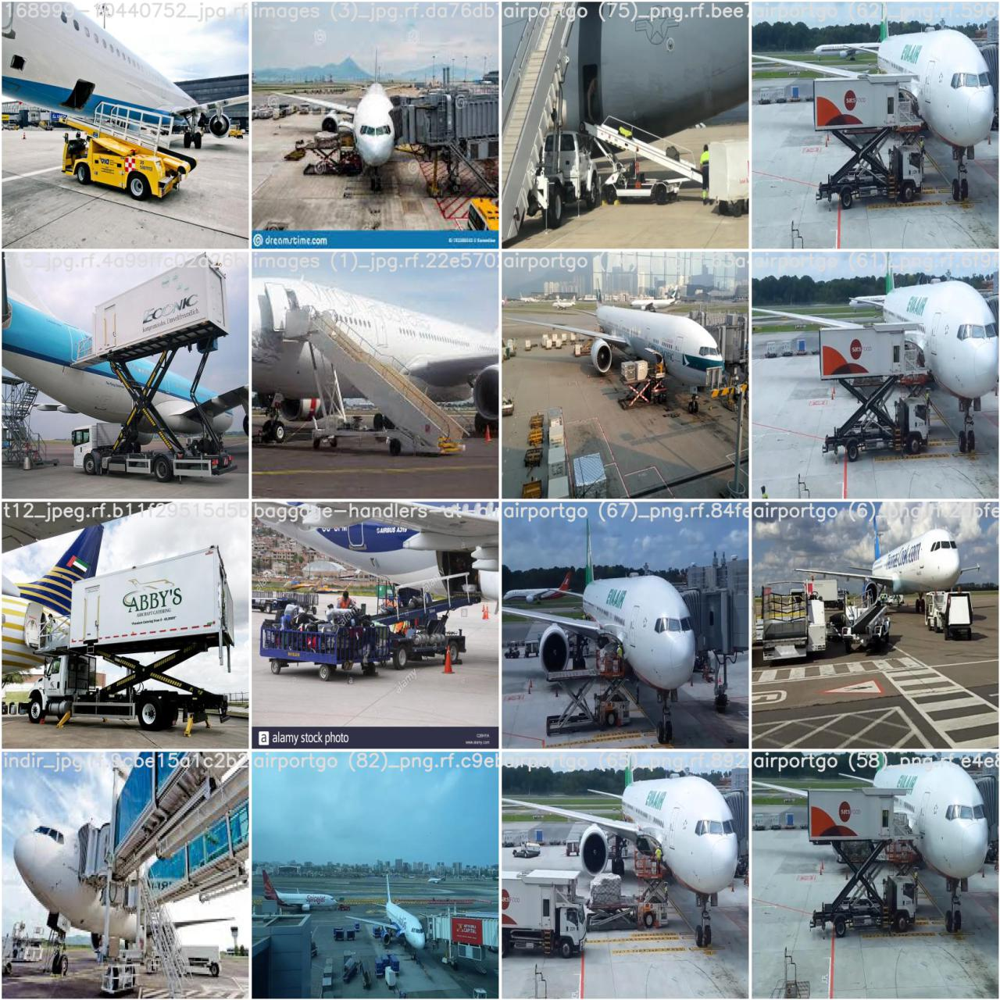

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

In [ ]:
%ls runs/train/

yolov5s_results/


In [ ]:

%ls runs/train/yolov5s_results/weights

best.pt  last.pt


## Detection

Image detection

In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results/weights/best.pt'])
Using torch 1.7.0+cu101 CUDA:0 (Tesla T4, 15079MB)

Fusing layers... 
Model Summary: 232 layers, 7257306 parameters, 0 gradients
image 1/14 /content/test/images/294_thyssenkrupp_istanbulun_yeni_mega_havalimanina_143_adet_yolcu_binis_koprusu_tedarik_edecek_jpg.rf.0419f7ea5ccb19fc89c9a8726cd0900f.jpg: 416x416 1 boarding bridges, Done. (0.011s)
image 2/14 /content/test/images/airportgo (100)_png.rf.73937078e62e38379d37b2055a91177d.jpg: 416x416 1 Catering trucks, 1 boarding bridges, 2 planes, Done. (0.011s)
image 3/14 /content/test/images/airportgo (16)_png.rf.42561f518d30ff1cfeb6356a98d51390.jpg: 416x416 1 boarding stairss, 1 planes, Done. (0.010s)
image 4/14 /content

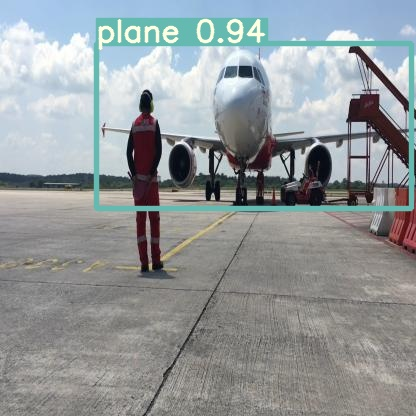

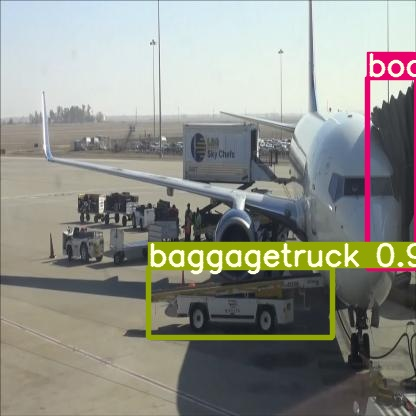

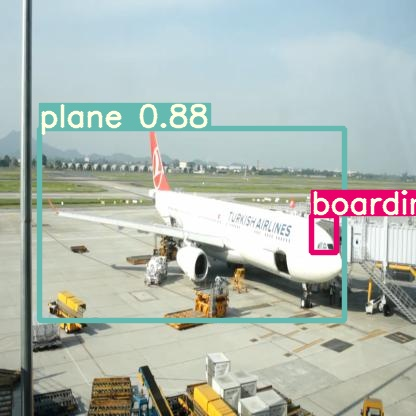

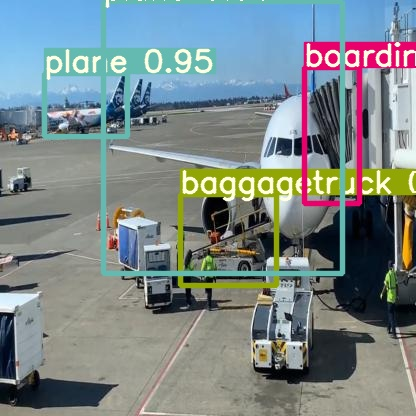

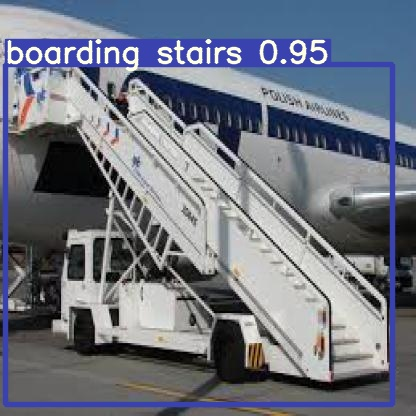

...

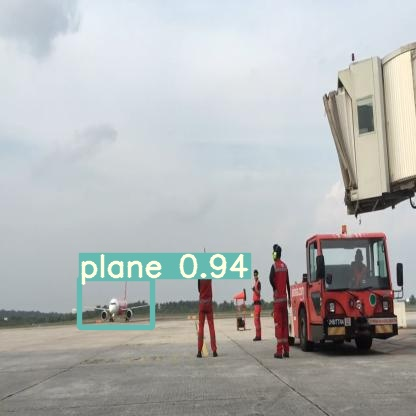

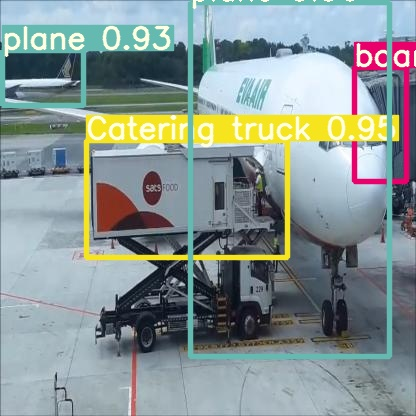

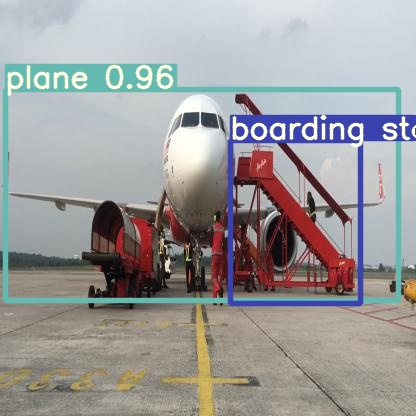

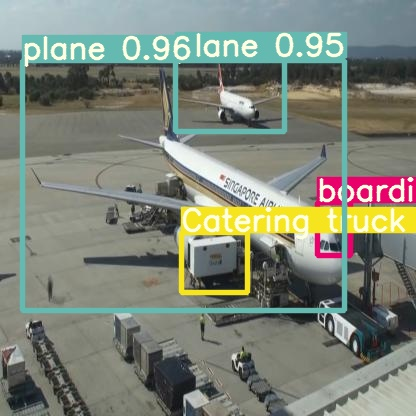

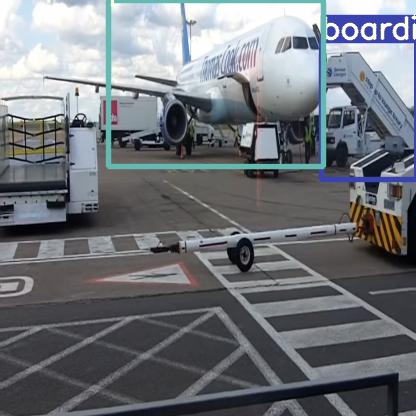

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Video detection

In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/video

## Exporting weights to drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive/COMP\ 491/ModelWeights/25-11-20

## Load and Detect

In [ ]:
%cp /content/gdrive/My\ Drive/COMP\ 491/ModelWeights/25-11-20/best.pt /content/yolov5/weights

In [ ]:
%cp -r /content/gdrive/My\ Drive/COMP\ 491/testVideos/video /content/test

In [ ]:
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/weights/best.pt --img 416 --conf 0.4 --source ../test/video --save-txt 

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=True, source='../test/video', update=False, view_img=False, weights=['/content/yolov5/weights/best.pt'])
Using torch 1.7.0+cu101 CUDA:0 (Tesla T4, 15079MB)

Fusing layers... 
Model Summary: 232 layers, 7257306 parameters, 0 gradients
video 1/1 (1/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.032s)
video 1/1 (2/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.011s)
video 1/1 (3/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.011s)
video 1/1 (4/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.010s)
video 1/1 (5/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.010s)
video 1/1 (6/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.010s)
video 1/1 (7/721) /content/test/video/vidTest1.

In [ ]:
%cp -r /content/yolov5/runs/detect/exp2 /content/gdrive/My\ Drive/COMP\ 491/resultVideos/25-11-20/

In [ ]:
%cd /content/yolov5/
!python detectGOP.py --weights /content/yolov5/weights/best.pt --img 416 --conf 0.4 --source ../test/video --save-txt 

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=True, source='../test/video', update=False, view_img=False, weights=['/content/yolov5/weights/best.pt'])
Using torch 1.7.0+cu101 CUDA:0 (Tesla T4, 15079MB)

Fusing layers... 
Model Summary: 232 layers, 7257306 parameters, 0 gradients
video 1/1 (1/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.012s)
video 1/1 (2/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.010s)
video 1/1 (3/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.010s)
video 1/1 (4/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.009s)
video 1/1 (5/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.010s)
video 1/1 (6/721) /content/test/video/vidTest1.mp4: 256x416 1 planes, Done. (0.010s)
video 1/1 (7/721) /content/test/video/vidTest1.